https://photutils.readthedocs.io/en/stable/aperture.html

In [ ]:
pip install photutils

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 5.6 MB/s eta 0:00:00


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.spatial.distance import cdist
import cv2
import sys
import pandas as pd
from IPython.display import display

from photutils.aperture import ApertureStats, aperture_photometry, CircularAperture, CircularAnnulus
from photutils.detection import DAOStarFinder, find_peaks
from astropy.io import fits
from astropy.wcs import WCS
from astropy.stats import sigma_clipped_stats
from astropy.table import Table

from google.colab import drive
drive.mount('/content/drive')
sys.path.append('/content/drive/MyDrive/Bachelor')
from phot_used_functions_test import filter_sources, determine_distance, determine_shift, determine_magnitudes, determine_fwhm
from plottingFinal import show_image

Mounted at /content/drive


# short exptime images: 7 # long exptime images: 7


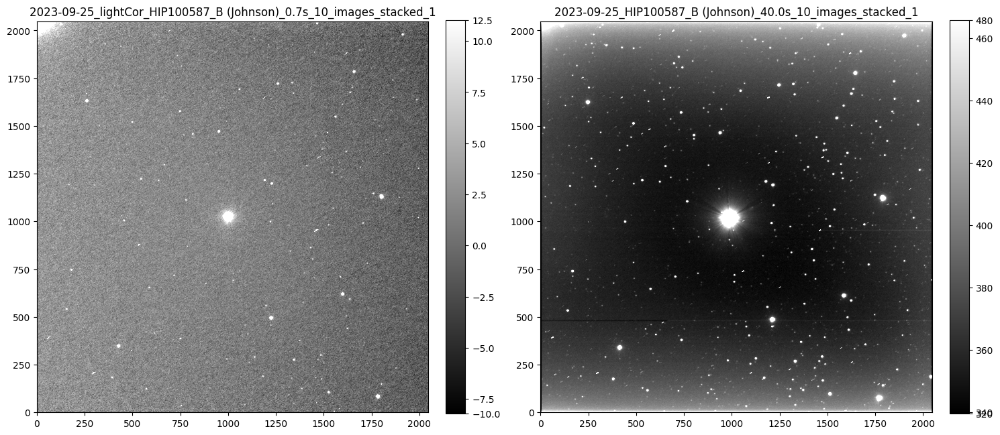

In [ ]:
path_short= '/content/drive/MyDrive/Bachelor/data/2023-09-25/stacked/lightCor_HIP100587_B (Johnson)_0.7s_10_images_stacked_'
path_long = '/content/drive/MyDrive/Bachelor/data/2023-09-25/stacked/lightCor_HIP100587_B (Johnson)_40.0s_10_images_stacked_'

reference_image= fits.open("/content/drive/MyDrive/Bachelor/data/Coordinates Files/WCS_HIP100587.fits")[0].data
reference_positions_path = '/content/drive/MyDrive/Bachelor/data/Coordinates Files/final_table_gaia.csv'


image_list_short = []
titles_short = []
image_list_long = []
titles_long = []
header_list_long = []

for fits_path in glob.glob(os.path.join(path_short + '*fit')):
    with fits.open(fits_path) as hdul:
        image_list_short.append(hdul[0].data)
        exptime_short = hdul[0].header["EXPTIME"]
        #titles_short.append(hdul[0].header['DATE-OBS'][:10] + os.path.splitext(os.path.basename(fits_path))[0][8:]) #date + filename
        titles_short.append(hdul[0].header['DATE-OBS'][:10] +"_" + os.path.splitext(os.path.basename(fits_path))[0])


for fits_path in glob.glob(os.path.join(path_long + '*fit')):
    with fits.open(fits_path) as hdul:
        image_list_long.append(hdul[0].data)
        exptime_long = hdul[0].header["EXPTIME"]
        header_list_long.append(hdul[0].header)
        titles_long.append(hdul[0].header['DATE-OBS'][:10] + os.path.splitext(os.path.basename(fits_path))[0][8:]) #date + filename

print("# short exptime images:",len(image_list_short), "# long exptime images:", len(image_list_long))
fig, ax = plt.subplots(1, 2, figsize=(15, 30))
show_image(image_list_short[0], fig=fig, ax=ax[0])
show_image(image_list_long[4] , fig=fig, ax=ax[1])
ax[0].set_title(titles_short[0])
ax[1].set_title(titles_long[0])
plt.tight_layout()

# Bright source

[-15.68295129260184, -15.656782764947977, -15.702893907711598, -15.671381297425228, -15.402500520200661, -15.462620783815009, -15.649392503291446]
0.11083458363174205


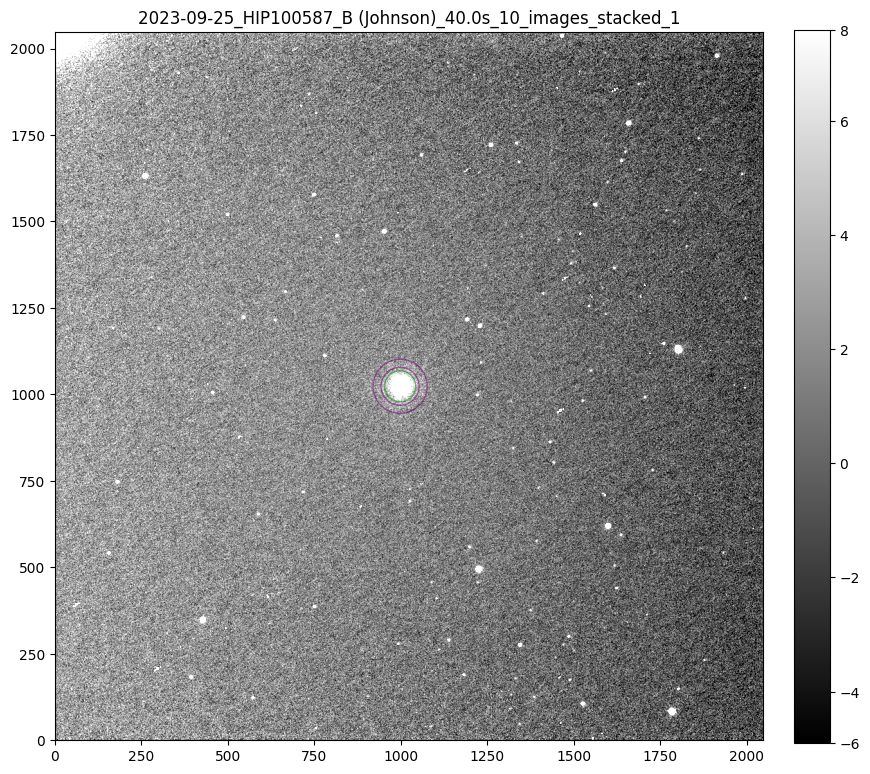

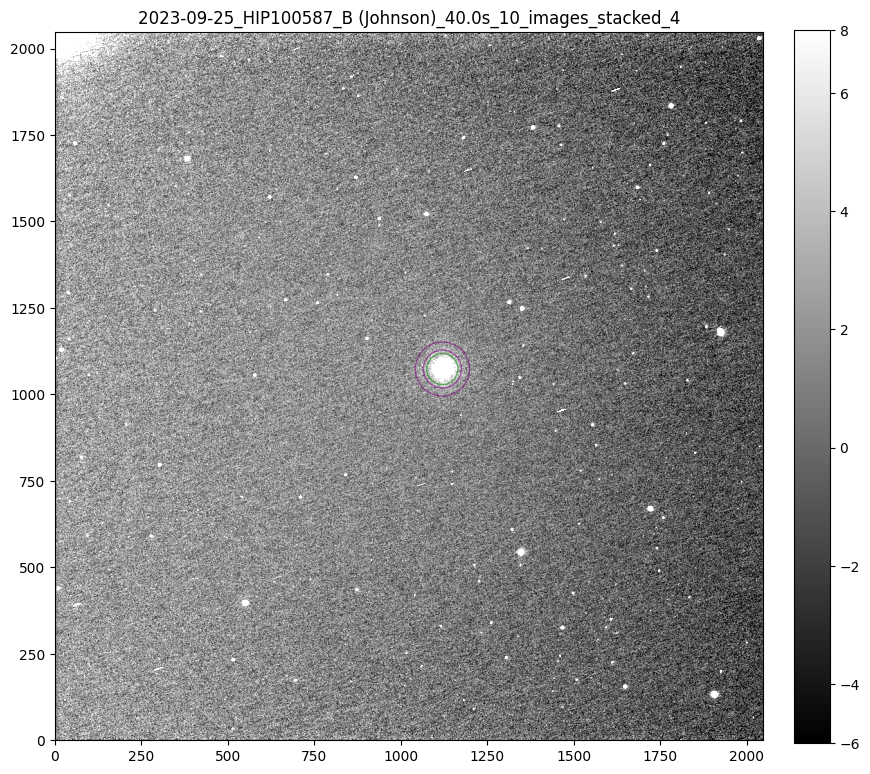

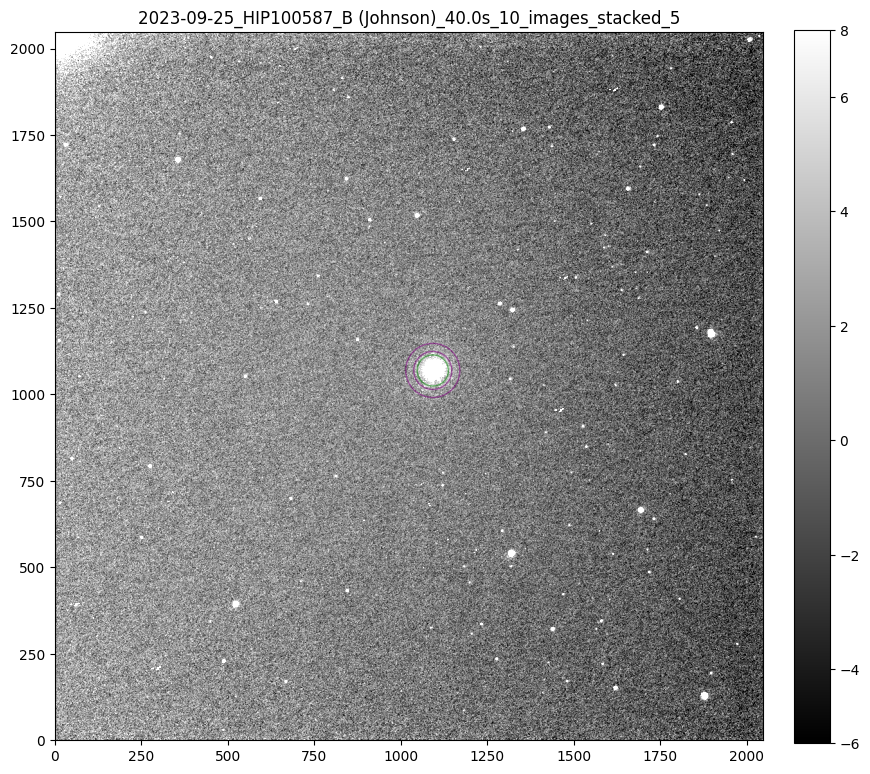

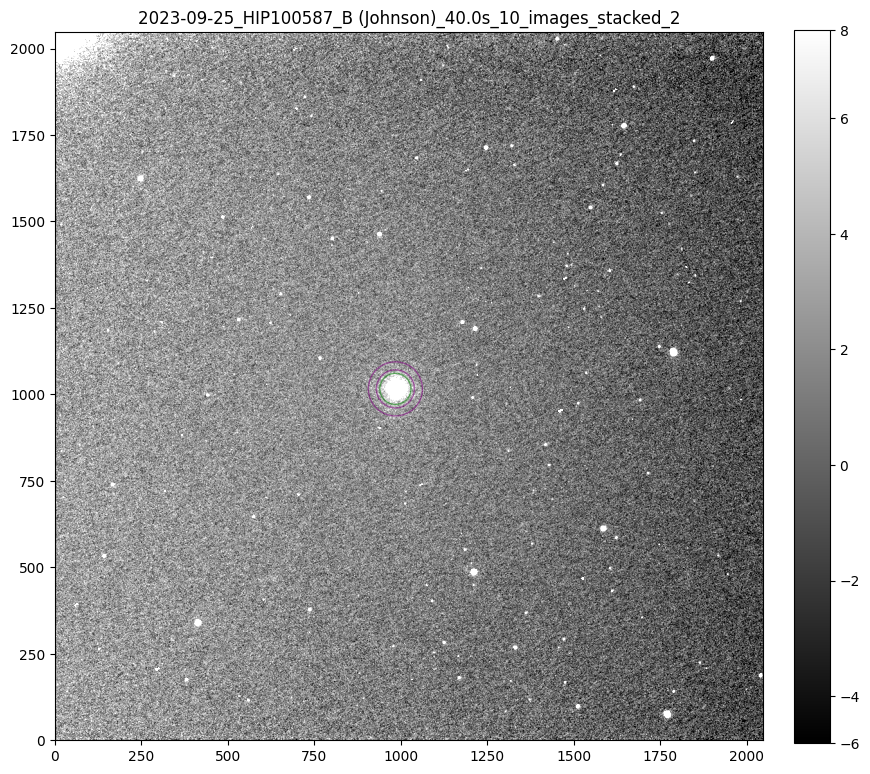

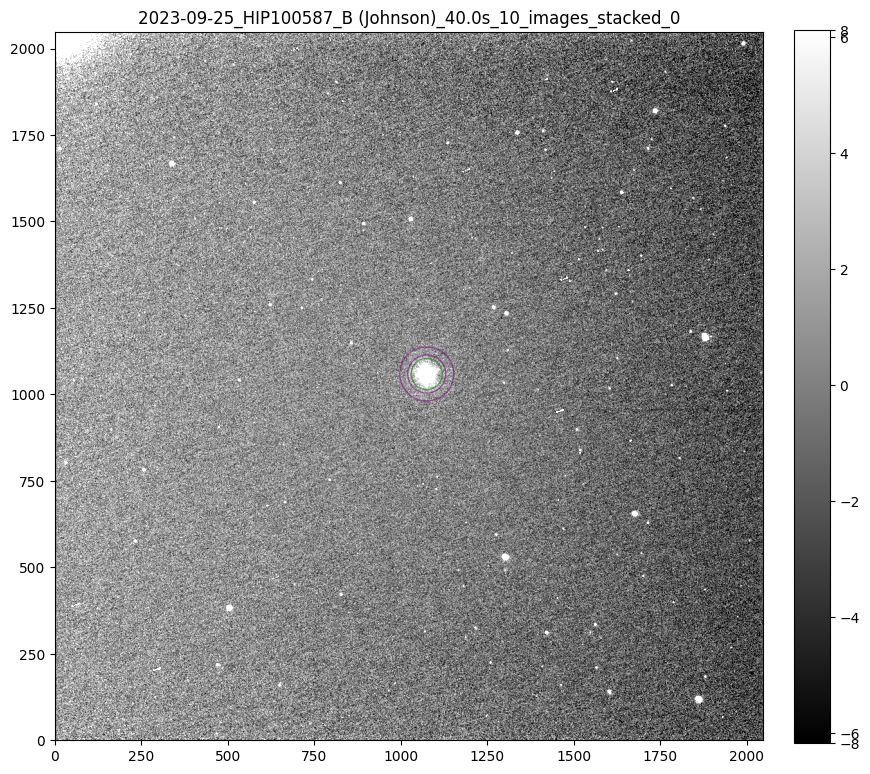

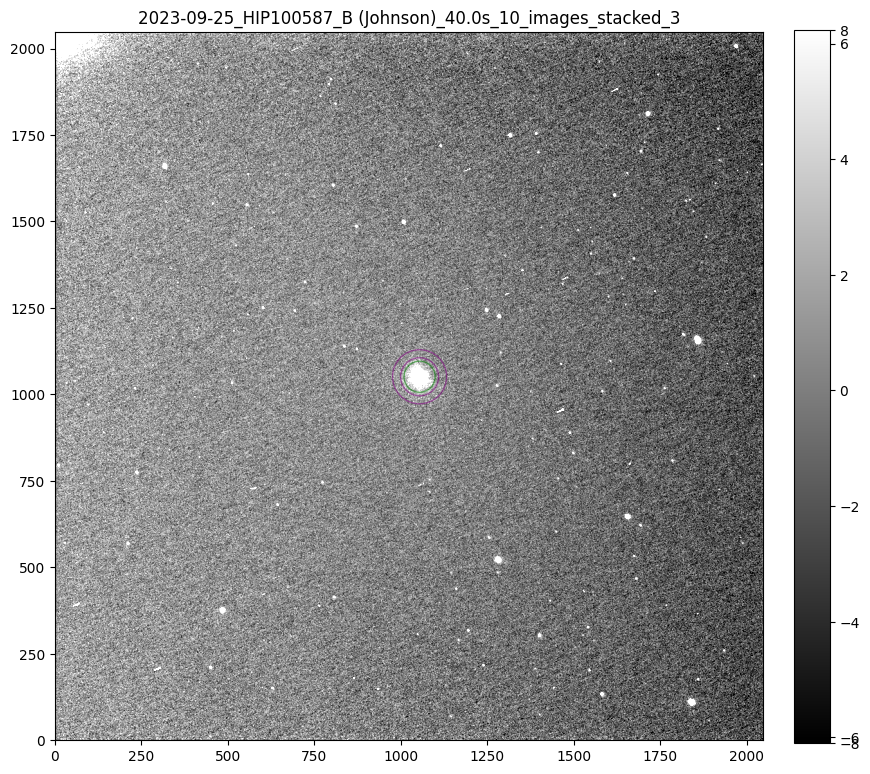

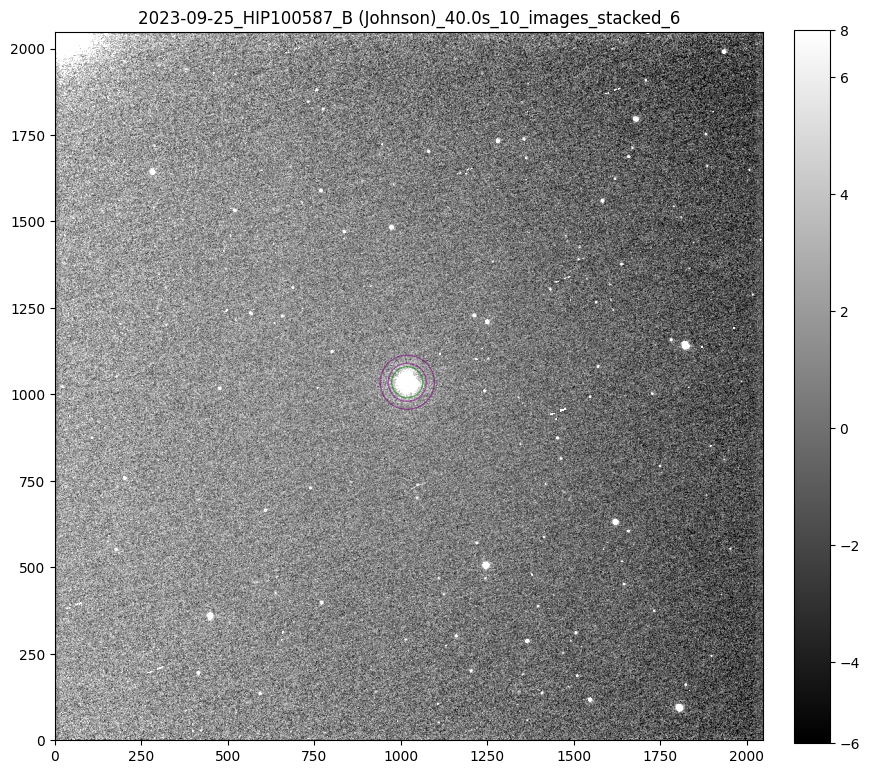

In [ ]:
radius_bright = 45 ###### change here
mask = np.zeros(image_list_long[0].shape, dtype=bool)
mask[1900:2048, 0:200] = True #for newer pictures
position_bright = []
magnitude_list_bright = []


for i, image in enumerate(image_list_short):

    mean, median, std = sigma_clipped_stats(image, sigma=3.0)
    daofind = DAOStarFinder(fwhm=5.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0,brightest=1) #roundlo and roundhi to adjust detection shape. need to be
    sources = daofind(image, mask=mask)
    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
    determine_fwhm(image, positions)

    fig, ax = plt.subplots(1,1, figsize=(10,10))
    show_image(image, fig=fig, ax=ax)
    ax.set_title(titles_long[i])

    magnitudes = determine_magnitudes(image, positions=positions, star_radius=radius_bright, exptime=exptime_short)
    magnitude_list_bright.append(magnitudes)
    position_bright.append(positions)

print(magnitude_list_bright)
print(np.std(magnitude_list_bright))

# Use positions from file


In [ ]:
df = pd.read_csv(reference_positions_path)
print(len(df))
df = df[['Position Number'] + ['x'] +['y'] +  ['DR2Name'] + ['RAJ2000'] + ['DEJ2000'] + ['BPmag'] + ['e_BPmag'] + ['RPmag'] +['e_RPmag'] ]

bright_row_index = df['BPmag'].idxmin()
ref_mag_bright = df['BPmag'][bright_row_index] #save mag for bright star for later
ref_mag_bright_err = df['e_BPmag'][bright_row_index]
ref_bright_position = ( df['x'][bright_row_index],  df['y'][bright_row_index])
print(ref_bright_position)
print(ref_mag_bright)
df.tail()

308
(984.3975805799166, 1019.7079286509296)
4.7075


,Position Number,x,y,DR2Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag
303,306,1972.916385,1627.154094,Gaia DR2 1862201341716985984,306.180261,32.301488,13.7917,0.0017,12.5145,0.0007
304,307,1973.692971,1502.411954,Gaia DR2 1862199658089794816,306.180263,32.278584,14.9952,0.0021,13.8941,0.0013
305,308,1974.773269,207.086736,Gaia DR2 1862176671424379392,306.179024,32.040670,16.7126,0.0031,15.3507,0.0024
306,309,1981.881565,1267.336579,Gaia DR2 1862196496993843072,306.181688,32.235402,13.9919,0.0010,13.0880,0.0011
307,310,984.397581,1019.707929,Gaia DR2 1862193748214492800,305.965056,32.190134,4.7075,0.0026,3.2097,0.0026


In [ ]:
df.drop(bright_row_index, inplace= True) #remove brightest star, because we want to use the positions to deteremine background stars
print(len(df))
df.tail()

307


,Position Number,x,y,DR2Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag
302,305,1972.389124,1915.328224,Gaia DR2 1862202372509315328,306.180430,32.354354,16.0557,0.0016,14.6404,0.0013
303,306,1972.916385,1627.154094,Gaia DR2 1862201341716985984,306.180261,32.301488,13.7917,0.0017,12.5145,0.0007
304,307,1973.692971,1502.411954,Gaia DR2 1862199658089794816,306.180263,32.278584,14.9952,0.0021,13.8941,0.0013
305,308,1974.773269,207.086736,Gaia DR2 1862176671424379392,306.179024,32.040670,16.7126,0.0031,15.3507,0.0024
306,309,1981.881565,1267.336579,Gaia DR2 1862196496993843072,306.181688,32.235402,13.9919,0.0010,13.0880,0.0011


In [ ]:
ref_positions = list(zip(df['x'], df['y']))
print(ref_positions[:10])

[(72.3664007424267, 853.0532150282611), (88.29634288997346, 603.9818677027345), (102.24728362956324, 85.08914995464644), (105.53728795960976, 1647.7994705568303), (125.5806354969892, 736.4377873130047), (130.79731898173347, 1603.9533356739576), (143.3147953226861, 531.6439854902745), (150.00739505926626, 1394.3950196974492), (154.97836119953644, 1182.4612569897836), (162.03142712762536, 676.6940069040479)]


In [ ]:
shifts_ref = determine_shift(imageList=image_list_long, referenceImage= reference_image)
print(shifts_ref)

Number of images to process: 7
[(12.404385, 8.716066), (15.240919, 6.3657303), (15.506778, 6.8953815), (50.98228, 26.619541), (0.013666479, 0.004250858), (0.15728554, 0.12283248), (-0.73658687, 0.36135462)]


In [ ]:
'''
print(position_bright)
print(ref_bright_position)

shifts_ref = []

for i, pos in enumerate (position_bright):
  x_shift = pos[0][0] - ref_bright_position
  y_shift = pos[0][1] - ref_bright_position
  tuple = (x_shift, y_shift)
  shifts_ref.append(tuple)
print(shifts_ref)
'''

'\nprint(position_bright)\nprint(ref_bright_position)\n\nshifts_ref = []\n\nfor i, pos in enumerate (position_bright):\n  x_shift = pos[0][0] - ref_bright_position\n  y_shift = pos[0][1] - ref_bright_position\n  tuple = (x_shift, y_shift)\n  shifts_ref.append(tuple)\nprint(shifts_ref)\n'

307
307
307
[-5.592291233175523, -1.0042029038559932, -1.2209751341742936, -5.576864454511406, -5.572424056172227, -0.9055466694612974, -1.18057104261804]
2.2303863337263388


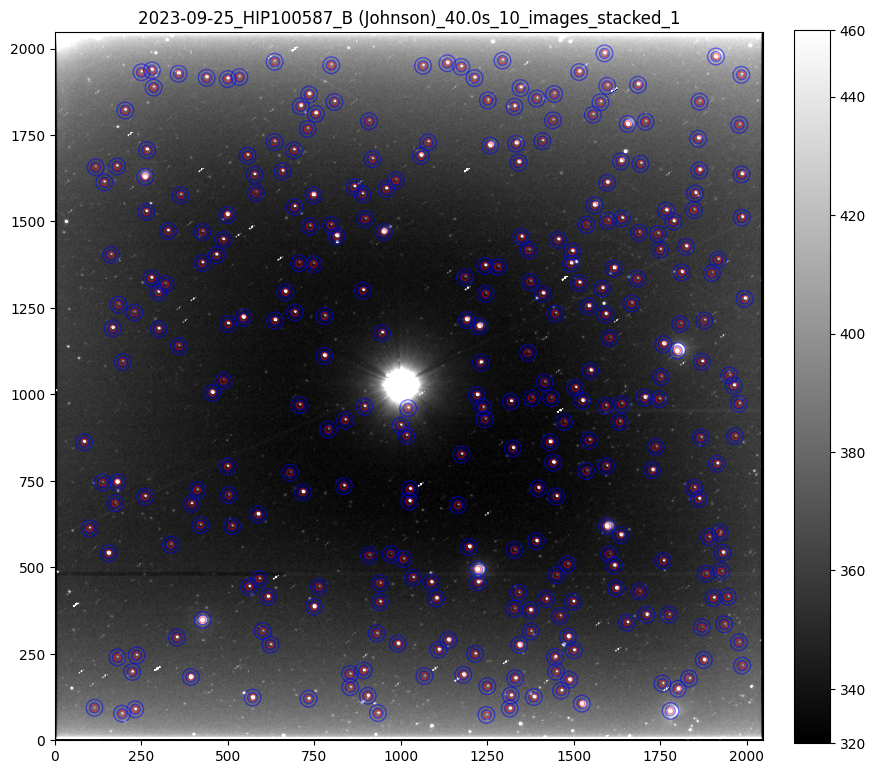

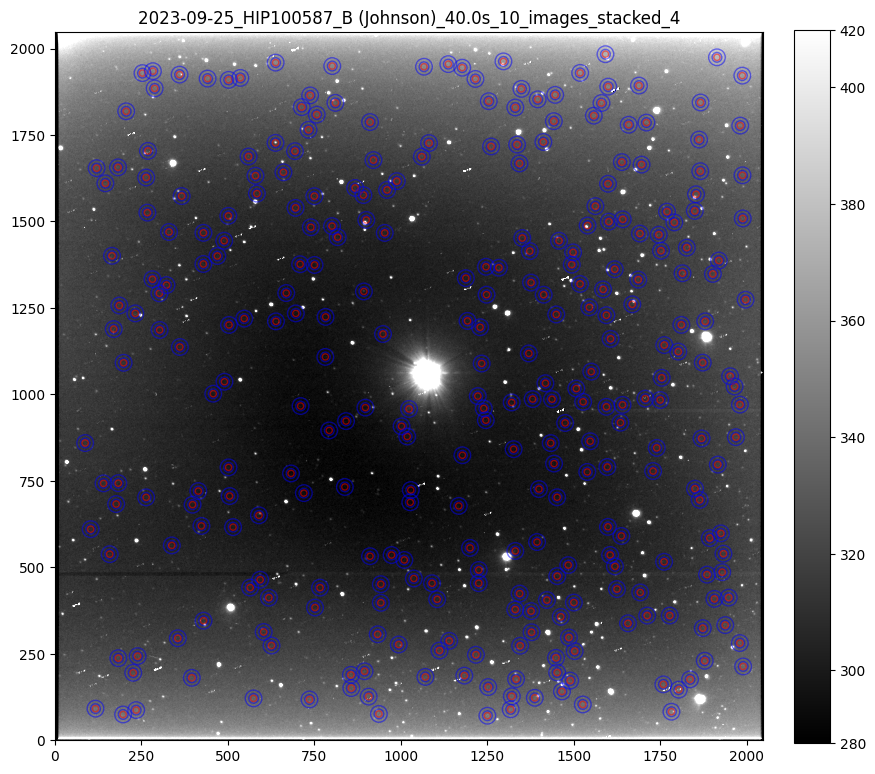

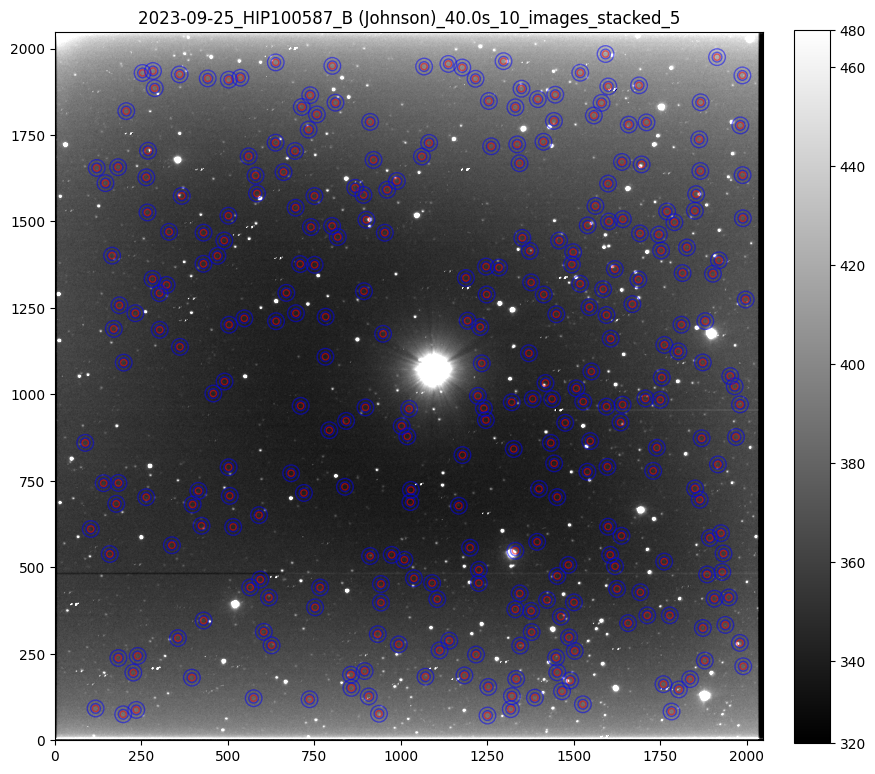

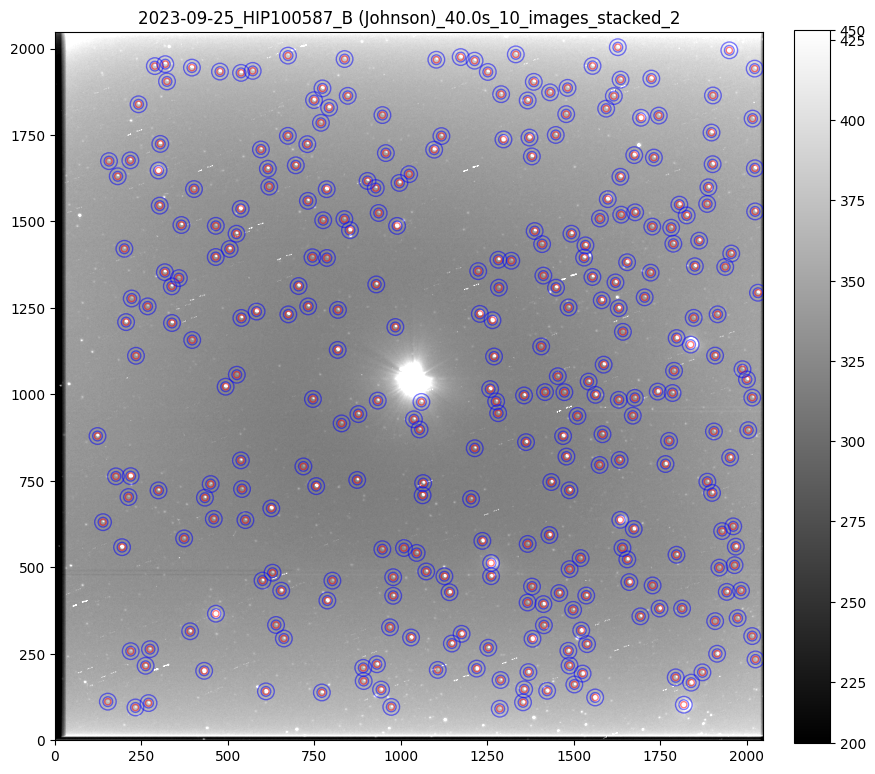

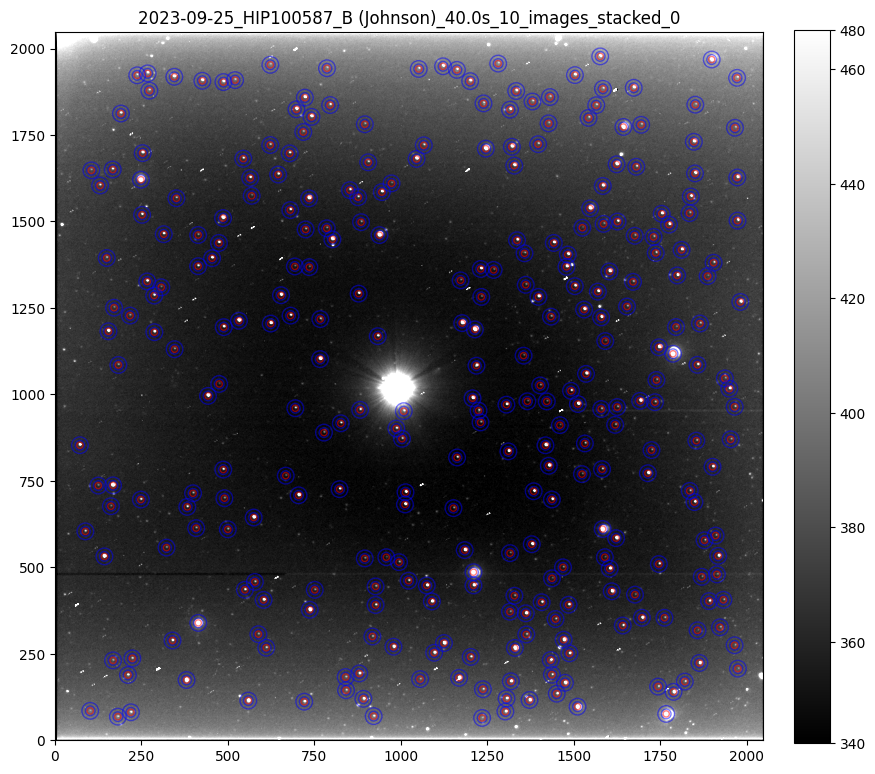

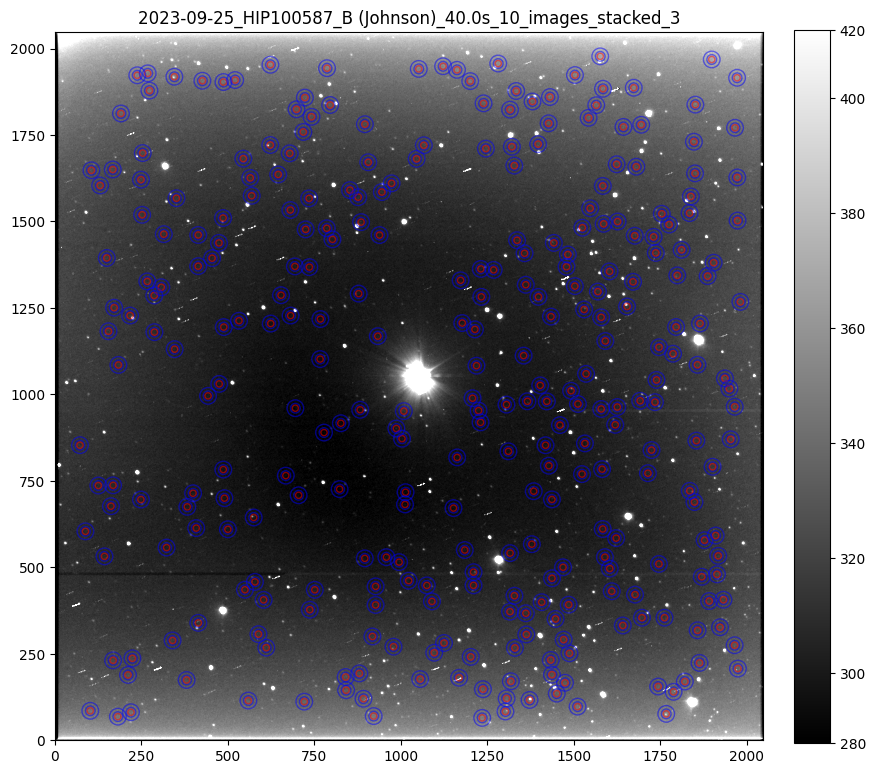

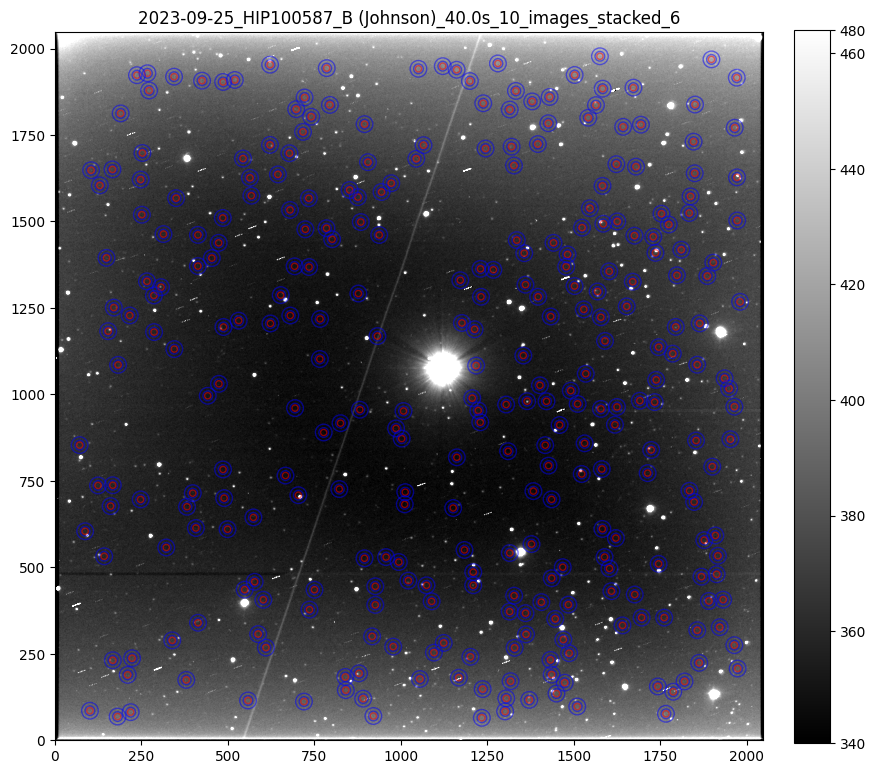

In [ ]:
magnitude_list_faint = []

print(len(ref_positions))
#ref_positions, fwhm = determine_fwhm(image_list_long[0], ref_positions) ####################### change later
print(len(ref_positions))
edge_dist = 15
valid_positions = []
# remove positions which are outside the frame
for position in ref_positions:
  if edge_dist < position[0]+shifts_ref[-1][0] < 2048-edge_dist and edge_dist < position[1]+shifts_ref[-1][1] < 2048-edge_dist:
    valid_positions.append(position)
print(len(valid_positions))
#radii = [value * 3 for value in fwhm]
radii = 9 * np.ones(len(ref_positions))


for i,image in enumerate (image_list_long):

    shifted_positions = []
    for position in valid_positions:
        tuple = np.array((position[0]+shifts_ref[i][0], position[1]+shifts_ref[i][1]))
        #tuple = np.array((position[0], position[1]))
        shifted_positions.append(tuple)

    fig, ax = plt.subplots(1,1, figsize = (10,10))
    show_image(image, fig=fig, ax=ax)
    ax.set_title(titles_long[i])

    apertures_faint = [CircularAperture(position, r=r) for position, r in zip(shifted_positions, radii)]
    annulus_apertures_faint = [CircularAnnulus(position,r_in=radius+5, r_out=radius+15) for position,radius in zip(shifted_positions,radii)]

    for aperture in apertures_faint:
        aperture.plot(color="red", lw=1.0, alpha=0.5)
    for anulus in annulus_apertures_faint:
        anulus.plot(color="blue", lw=1.0, alpha=0.5)

    # Initialize an empty table to store the photometry results
    phot_table_faint = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
    for j in range(len(apertures_faint)):
        aperstats = ApertureStats(image, annulus_apertures_faint[j])
        bkg = aperstats.median
        aperture_area = apertures_faint[j].area_overlap(image)
        total_bkg = bkg * aperture_area
        phot_table = aperture_photometry(image, apertures_faint[j])
        phot_table['total_bkg'] = total_bkg
        phot_table_faint.add_row([j, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])

    magnitudes=[]
    for row in phot_table_faint:
        magnitude =  - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime_long))
        magnitudes.append(magnitude)
    magnitude_list_faint.append(magnitudes)

mean_faint_magnitudes_list = [np.mean(mag) for mag in magnitude_list_faint]
print(mean_faint_magnitudes_list)
print(np.std(mean_faint_magnitudes_list))


In [ ]:
filtered_df = df[df.apply(lambda row: (row['x'], row['y']) in valid_positions, axis=1)] #only use valid positions in table

for i, mag_list in enumerate(magnitude_list_faint):
    col_name = f'Mag_Im_{i+1}'  # create coloumn for each image
    filtered_df = filtered_df.assign(**{col_name: mag_list})  # Add magnitudes for the current image to the DataFrame

# Calculate mean magnitudes for all positions across all images
mag_columns = [f'Mag_Im_{i+1}' for i in range(len(image_list_long))]
filtered_df['Mean_Mag'] = filtered_df[mag_columns].mean(axis=1)
######################## add data fro bright star
display(filtered_df)
filtered_df.to_csv(path_short[:48] + 'results/results_'+ titles_long[0][:74])

,Position Number,x,y,DR2Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag,Mag_Im_1,Mag_Im_2,Mag_Im_3,Mag_Im_4,Mag_Im_5,Mag_Im_6,Mag_Im_7,Mean_Mag
0,1,72.366401,853.053215,Gaia DR2 2054252728498404096,305.767058,32.160788,14.5081,0.0033,13.5037,0.0047,-6.088991,-0.720691,-1.129829,-6.013736,-6.071322,-1.033758,-0.178290,-3.033802
1,2,88.296343,603.981868,Gaia DR2 2054252316181517568,305.770362,32.114936,15.2586,0.0029,13.5073,0.0018,-4.793453,-0.858542,-0.569108,-4.835350,-4.846809,1.402648,-0.130028,-2.090092
2,3,102.247284,85.089150,Gaia DR2 2054250563834814848,305.773121,32.019563,16.2845,0.0046,13.9831,0.0011,-3.114401,4.041766,-2.182554,-3.436416,-3.401903,-1.400294,3.221769,-0.896005
3,4,105.537288,1647.799471,Gaia DR2 2054351272227274752,305.774488,32.306629,16.3917,0.0028,15.1478,0.0020,-3.945492,-1.058753,1.732380,-4.077075,-4.049591,-1.312559,-2.062054,-2.110449
4,5,125.580635,736.437787,Gaia DR2 2054252414949689344,305.778435,32.139275,16.2563,0.0026,14.6911,0.0019,-3.948582,-0.876553,-0.794532,-3.954309,-4.017914,-0.755350,-0.850932,-2.171167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
302,305,1972.389124,1915.328224,Gaia DR2 1862202372509315328,306.180430,32.354354,16.0557,0.0016,14.6404,0.0013,-4.260167,-2.150201,-1.014964,-4.596690,-4.475285,-0.592147,-1.930373,-2.717118
303,306,1972.916385,1627.154094,Gaia DR2 1862201341716985984,306.180261,32.301488,13.7917,0.0017,12.5145,0.0007,-6.739580,-0.201767,3.129563,-6.766275,-6.710647,-1.746796,-6.126667,-3.594595
304,307,1973.692971,1502.411954,Gaia DR2 1862199658089794816,306.180263,32.278584,14.9952,0.0021,13.8941,0.0013,-5.802604,-1.233530,1.037531,-5.892436,-5.751451,-2.122020,0.321388,-2.777589
305,308,1974.773269,207.086736,Gaia DR2 1862176671424379392,306.179024,32.040670,16.7126,0.0031,15.3507,0.0024,-3.728285,-1.470521,-1.681228,-4.143765,-3.646292,-2.387749,-1.620713,-2.668365


# Diff Phot


In [ ]:
diff_magnitude_list = []
print("index  bright mag        faint mag         diff mag")
for index in range (len(image_list_short)):
#for index in ([1,2,3,4]):
  diff_magnitude= magnitude_list_bright[index] - mean_faint_magnitudes_list [index]
  print(index,  magnitude_list_bright[index] , mean_faint_magnitudes_list [index], diff_magnitude)
  diff_magnitude_list.append(diff_magnitude)

print("")
print("The differential Magnitude is: M = ", np.mean(diff_magnitude_list),"+-",np.std(diff_magnitude_list),"mag")
print(f"Value for bright star: {np.mean(magnitude_list_bright)}+-{np.std(magnitude_list_bright)}")
print(f"Value for faint stars: {np.mean(mean_faint_magnitudes_list)}+-{np.std(mean_faint_magnitudes_list)}")
print("")
print(round(np.mean(diff_magnitude_list),4), "err", round(np.std(diff_magnitude_list),4))
print(round(np.std(magnitude_list_bright),4), ",", round(np.std(mean_faint_magnitudes_list),4))

index  bright mag        faint mag         diff mag
0 -15.68295129260184 -5.592291233175523 -10.090660059426318
1 -15.656782764947977 -1.0042029038559932 -14.652579861091983
2 -15.702893907711598 -1.2209751341742936 -14.481918773537304
3 -15.671381297425228 -5.576864454511406 -10.094516842913823
4 -15.402500520200661 -5.572424056172227 -9.830076464028433
5 -15.462620783815009 -0.9055466694612974 -14.55707411435371
6 -15.649392503291446 -1.18057104261804 -14.468821460673407

The differential Magnitude is: M =  -12.596521082289284 +- 2.246392649819782 mag
Value for bright star: -15.604074724284825+-0.11083458363174205
Value for faint stars: -3.00755364199554+-2.2303863337263388

-12.5965 err 2.2464
0.1108 , 2.2304


In [ ]:
# from ref image
ref_mag_faint = filtered_df['BPmag'].mean()
err = filtered_df['e_BPmag']
n = len(filtered_df)
sem_faint = np.sqrt(np.sum(err ** 2)) / n

ref_diff_mag = ref_mag_bright -  ref_mag_faint
ref_diff_mag_err = np.sqrt(ref_mag_bright_err**2 + sem_faint**2)

print(f'The differential magniude calculated from gaia data is M = {ref_diff_mag}+-{ref_diff_mag_err}')

sigma_dev = (abs(diff_magnitude_list-ref_diff_mag))/(np.sqrt(ref_diff_mag_err**2+(np.std(diff_magnitude_list))**2))
print(f'The deviation between own and gaia value is: {sigma_dev} sigma')

The differential magniude calculated from gaia data is M = -10.058887947882736+-0.002607538732495982
The deviation between own and gaia value is: [0.0141436  2.04491802 1.9689469  0.01586048 0.10185723 2.00240289
 1.96311653] sigma


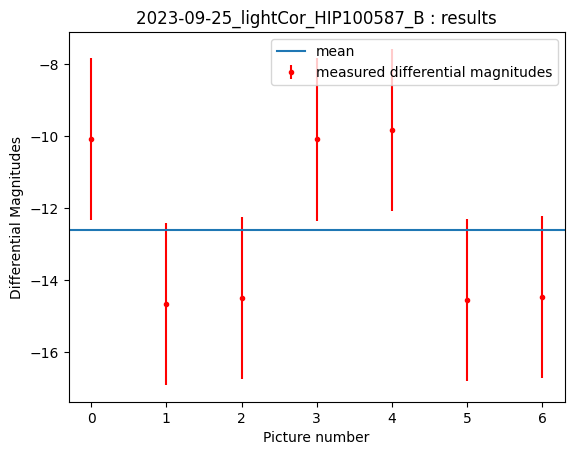

In [ ]:
x= np.linspace(0,(len(diff_magnitude_list))-1, len(diff_magnitude_list))
plt.errorbar(x, diff_magnitude_list, yerr= np.std(diff_magnitude_list), linestyle = "None", marker = ".",color="r", label = "measured differential magnitudes")
plt.axhline(np.mean(diff_magnitude_list), label= "mean" )
plt.xlabel("Picture number")
plt.ylabel("Differential Magnitudes")
plt.title(titles_short[0][:32]+ ": results")
plt.legend()

,Unnamed: 0,Position Number,x,y,DR2Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag,Mag_Im_1,Mag_Im_2,Mag_Im_3,Mag_Im_4,Mag_Im_5,Mag_Im_6,Mag_Im_7,Mean_Mag,difference
0,0,1,72.366401,853.053215,Gaia DR2 2054252728498404096,305.767058,32.160788,14.5081,0.0033,13.5037,0.0047,-6.077006,-6.085996,-6.010602,-5.850998,-5.660482,-6.106878,-6.061045,-5.979001,-0.201721
1,1,2,88.296343,603.981868,Gaia DR2 2054252316181517568,305.770362,32.114936,15.2586,0.0029,13.5073,0.0018,-4.852078,-4.792445,-4.822558,-4.615643,-4.372357,-4.885450,-4.811818,-4.736050,0.290730
2,2,3,102.247284,85.089150,Gaia DR2 2054250563834814848,305.773121,32.019563,16.2845,0.0046,13.9831,0.0011,-3.448220,-3.038860,-3.482372,-3.387217,-3.184251,-3.460752,-3.370418,-3.338870,0.662010
3,3,4,105.537288,1647.799471,Gaia DR2 2054351272227274752,305.774488,32.306629,16.3917,0.0028,15.1478,0.0020,-4.070954,-3.968004,-4.061030,-3.831172,-3.525919,-4.030256,-4.135712,-3.946150,-0.052470
4,4,5,125.580635,736.437787,Gaia DR2 2054252414949689344,305.778435,32.139275,16.2563,0.0026,14.6911,0.0019,-4.125996,-3.925220,-3.937354,-3.680973,-3.635605,-3.934657,-4.110589,-3.907199,0.121881
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,284,287,1870.326282,472.611857,Gaia DR2 1862188731692581760,306.156634,32.089550,16.3386,0.0028,14.9006,0.0013,-4.129623,-4.083544,-3.993414,-3.816341,-3.380602,-4.027212,-4.001365,-3.918872,0.027908
284,285,288,1878.337228,578.196079,Gaia DR2 1862188903491620224,306.158492,32.108925,15.6453,0.0021,14.1948,0.0008,-4.513579,-4.466280,-4.500049,-4.274047,-4.008120,-4.602074,-4.770960,-4.447873,0.192207
285,286,289,1887.236569,1341.927647,Gaia DR2 1862199486291101056,306.161248,32.249246,16.4986,0.0050,15.1218,0.0015,-3.783315,-3.664069,-3.650245,-3.209710,-3.241068,-3.887642,-3.970725,-3.629539,0.157241
286,287,290,1891.678241,402.409701,Gaia DR2 1862188521218689536,306.161223,32.076693,14.4012,0.0015,12.5766,0.0011,-5.386592,-5.429481,-5.398602,-5.237108,-5.098713,-5.485556,-5.493941,-5.361428,0.522752


"\nplt.title('Differences between Gaia DR3 and 70cm magnitudes')\nplt.plot(filtered_df['difference'], linestyle = 'none', marker = '.')\nplt.axhline(filtered_df['difference'].mean(), color='red', label='mean')\nplt.legend()\n"

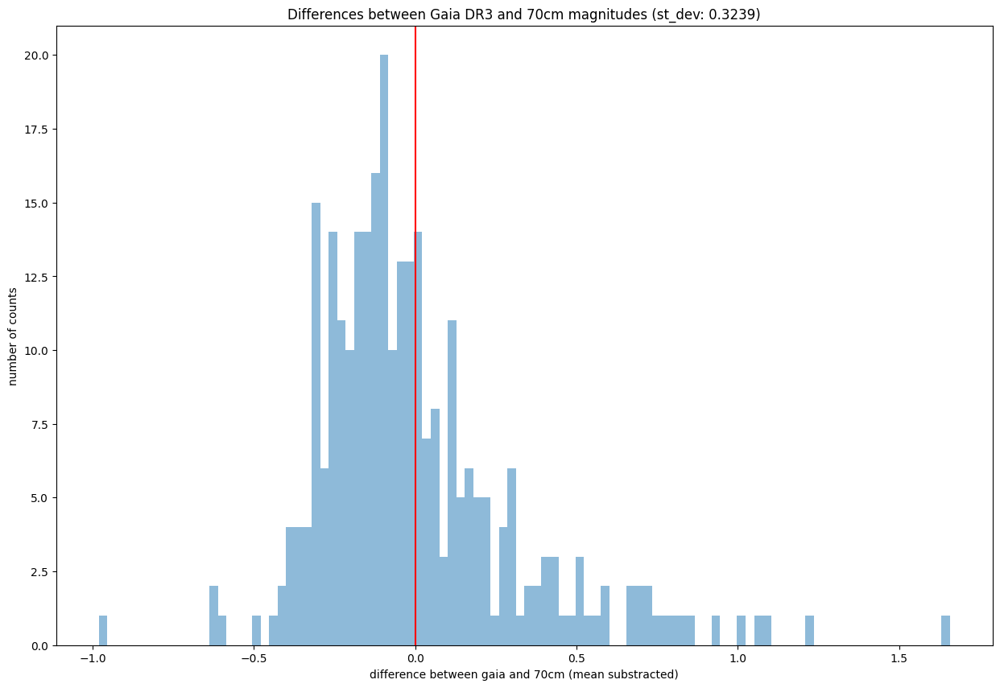

In [ ]:
filtered_df = pd.read_csv('/content/drive/MyDrive/Bachelor/data/2023-09-25/results/results_2023-09-25_HIP100587_B (Johnson)_40.0s_long-short-series_10_images_stacked')
filtered_df['difference'] = filtered_df['Mean_Mag']-filtered_df['BPmag']
filtered_df['difference'] = filtered_df['difference'] - filtered_df['difference'].mean()
display(filtered_df)
st_dev = filtered_df['difference'].std()

fig, ax = plt.subplots(1,1,figsize= (15,10))
ax = plt.axvline(0, color='red')
ax = filtered_df['difference'].plot.hist(bins=100, alpha=0.5)
ax.set_title(f"Differences between Gaia DR3 and 70cm magnitudes (st_dev: {round(st_dev,4)})")
ax.set_ylabel('number of counts')
ax.set_xlabel('difference between gaia and 70cm (mean substracted)')
'''
plt.title('Differences between Gaia DR3 and 70cm magnitudes')
plt.plot(filtered_df['difference'], linestyle = 'none', marker = '.')
plt.axhline(filtered_df['difference'].mean(), color='red', label='mean')
plt.legend()
'''

# Old code


# For plotting FWHM

In [ ]:
def determine_fwhm(data, positions,max_value=20):
    valid_positions = []
    fwhm = []
    x_values = [int(value[0]) for value in positions]
    y_values = [int(value[1]) for value in positions]
    for i in range(len(positions)):
        size = 30
        if x_values[i] < size or x_values[i] >= data.shape[1] - size:
            row_values = data[y_values[i], x_values[i] - x_values[i]: x_values[i] + x_values[i]]
        else:
            row_values = data[y_values[i], x_values[i] - size: x_values[i] + size]
        x_coordinates = range(len(row_values))
        row_values_bkg = row_values + np.median(row_values)  # add median as background
        half_max = (np.max(row_values_bkg) / 2)
        above_half_max_indices = np.where(row_values > half_max)[0]
        lower_index = above_half_max_indices[0]
        upper_index = above_half_max_indices[-1]
        x_lower = x_coordinates[lower_index]
        x_upper = x_coordinates[upper_index]
        calculated_fwhm = x_upper - x_lower
        plt.plot(x_coordinates, row_values)
        plt.xlabel("x_coordinates")
        plt.ylabel("pixel_counts")
        plt.title("1d profile for HIP100587_focused_B (Johnson)_0.7s_25.09.23")
        if calculated_fwhm <= max_value and calculated_fwhm > 0:
            fwhm.append(calculated_fwhm)
            valid_positions.append(positions[i])
    return valid_positions, fwhm

In [ ]:
#### determine image shift from wcs header (not working)
'''
from astropy.coordinates import SkyCoord
import astropy.units as u


shifts_ref = []
ref_header = fits.open("/content/drive/MyDrive/Bachelor/data/Coordinates Files/WCS_HIP100587.fits")[0].header
ref_wcs = WCS(ref_header)


ref_wcs = WCS(ref_header)

ref_ra = ref_header['CRVAL1']
ref_dec = ref_header['CRVAL2']
sky = SkyCoord(ra=ref_ra, dec=ref_dec, unit=(u.deg, u.deg))
center = ref_wcs.world_to_pixel(sky)
x_ref = center[0]
y_ref = center[1]


for i, header in enumerate(header_list_long):
    wcs = WCS(header)
    sky = SkyCoord(ra=header['CRVAL1'], dec=header['CRVAL2'], unit=(u.deg, u.deg))
    center = ref_wcs.world_to_pixel(sky)
    x = center[0]
    y = center[1]
    x_shift = x - x_ref
    y_shift = y - y_ref
    tuple = (x_shift, y_shift)
    shifts_ref.append(tuple)

print(shifts_ref)


#######################################################################################


from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u

# Load the reference header
ref_header = fits.open("/content/drive/MyDrive/Bachelor/data/Coordinates Files/WCS_HIP100587.fits")[0].header
ref_wcs = WCS(ref_header)

# Extract RA and DEC from the reference image
ref_ra = ref_header['CRVAL1']
ref_dec = ref_header['CRVAL2']
sky_ref = SkyCoord(ra=ref_ra * u.deg, dec=ref_dec * u.deg)

# Get pixel coordinates for the reference image
x_ref, y_ref = ref_wcs.world_to_pixel(sky_ref)

# List to store shifts
shifts_ref = []

# Iterate through the headers of other images
for i, header in enumerate(header_list_long):
    wcs = WCS(header)
    # Extract RA and DEC from the current image
    ra = header['CRVAL1']
    dec = header['CRVAL2']
    sky = SkyCoord(ra=ra * u.deg, dec=dec * u.deg)
    # Convert celestial coordinates to pixel coordinates for the current image
    x, y = wcs.world_to_pixel(sky)
    # Calculate shifts in pixel coordinates
    x_shift = x - x_ref
    y_shift = y - y_ref
    shifts_ref.append((x_shift, y_shift))

print(shifts_ref)
'''

'\nfrom astropy.coordinates import SkyCoord\nimport astropy.units as u\n\n\nshifts_ref = []\nref_header = fits.open("/content/drive/MyDrive/Bachelor/data/Coordinates Files/WCS_HIP100587.fits")[0].header\nref_wcs = WCS(ref_header)\n\n\nref_wcs = WCS(ref_header)\n\nref_ra = ref_header[\'CRVAL1\']\nref_dec = ref_header[\'CRVAL2\']\nsky = SkyCoord(ra=ref_ra, dec=ref_dec, unit=(u.deg, u.deg))\ncenter = ref_wcs.world_to_pixel(sky)\nx_ref = center[0]\ny_ref = center[1]\n\n\nfor i, header in enumerate(header_list_long):\n    wcs = WCS(header)\n    sky = SkyCoord(ra=header[\'CRVAL1\'], dec=header[\'CRVAL2\'], unit=(u.deg, u.deg))\n    center = ref_wcs.world_to_pixel(sky)\n    x = center[0]\n    y = center[1]\n    x_shift = x - x_ref\n    y_shift = y - y_ref\n    tuple = (x_shift, y_shift)\n    shifts_ref.append(tuple)\n\nprint(shifts_ref)\n\n\n#######################################################################################\n\n\nfrom astropy.io import fits\nfrom astropy.wcs import WCS\nfr